# Yelp Amenity Data cleaning and exploratory analysis

In [166]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# Show all columns in dataframes
pd.options.display.max_columns = 999
pd.options.display.max_rows = 100

np.seterr(invalid="ignore");

In [26]:
# phila bounds
phl_bound = gpd.read_file("data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")

In [33]:
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)

In [118]:
neigh = phl_neigh_proj[["mapname", "geometry"]]

## Read in amenity files

In [4]:
# amenities
restaurants = gpd.read_file("data/Yelp API/restaurants.geojson")
arts = gpd.read_file("data/Yelp API/arts.geojson")
beauty = gpd.read_file("data/Yelp API/beauty.geojson")
entertainment = gpd.read_file("data/Yelp API/entertainment.geojson")
kids = gpd.read_file("data/Yelp API/kids.geojson")
nightlife = gpd.read_file("data/Yelp API/nightlife.geojson")
outdoors = gpd.read_file("data/Yelp API/outdoors.geojson")
public_space = gpd.read_file("data/Yelp API/outdoors.geojson")
retail = gpd.read_file("data/Yelp API/retail.geojson")
shopping = gpd.read_file("data/Yelp API/shopping.geojson")
grocery = gpd.read_file("data/Yelp API/grocery.geojson")
education = gpd.read_file("data/Yelp API/education.geojson")

In [45]:
restaurants["type"] = "restaurant"
arts["type"] = "arts"
beauty["type"] = "beauty"
entertainment["type"] = "entertainment"
kids["type"] = "kids"
nightlife["type"] = "nightlife"
outdoors["type"] = "outdoors"
public_space["type"] = "public space"
retail["type"] = "retail"
shopping["type"] = "shopping"
grocery["type"] = "grocery"
education["type"] = "education"

In [46]:
# combine gdfs
amenities = gpd.GeoDataFrame(pd.concat([restaurants, arts, beauty, entertainment, kids, nightlife, outdoors, public_space, retail, shopping, grocery, education], ignore_index=True))

In [55]:
len(amenities)

17995

# Clip to Philadelphia boundaries

In [56]:
phl_bound_squeezed = phl_bound_proj.squeeze().geometry

# Amenity spatial patterns

In [117]:
amenities_phl = amenities.within(phl_bound_squeezed)
amenities_phl_gdf = amenities[amenities_phl]
amenities_phl_gdf.explore(tiles='CartoDB dark_matter', legend=True, column='type', cmap='Paired')

In [180]:
# count by type
amenities_grouped = amenities_phl_gdf.groupby('type').size().reset_index(name='count')

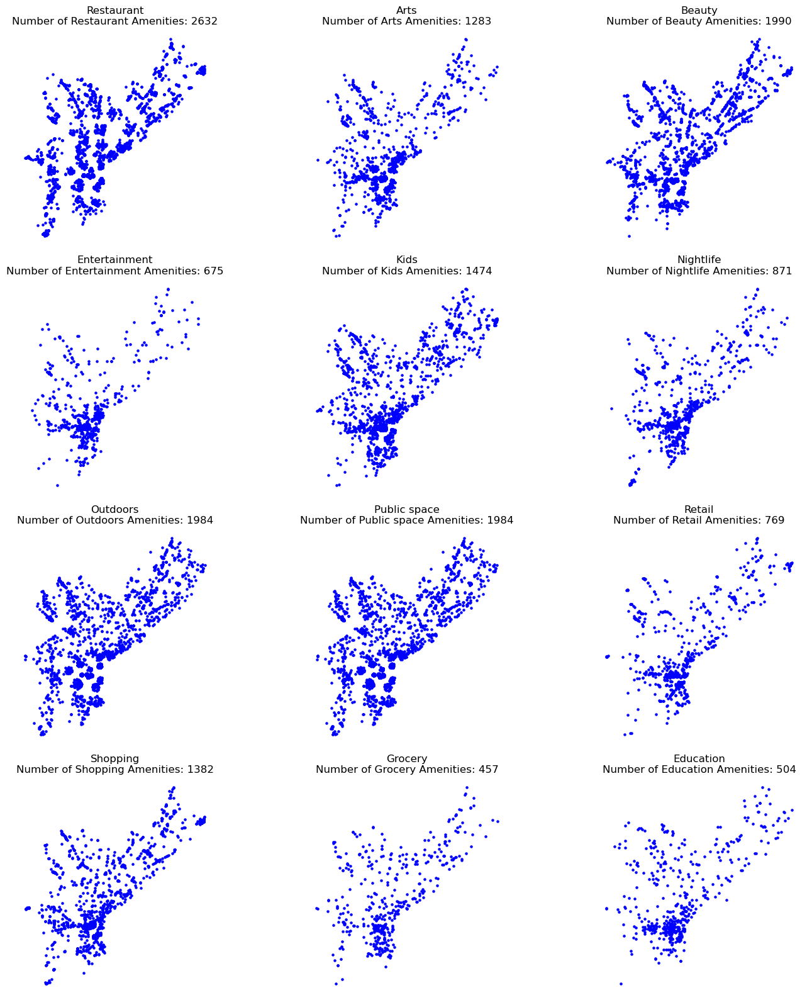

In [177]:
# Extract unique business types
business_types = amenities_phl_gdf['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenities_phl_gdf[amenities_phl_gdf['type'] == business_type]

    # Get count for the current business type
    count = amenities_grouped[amenities_grouped['type'] == business_type]['count'].values[0]

    # Plotting
    subset.plot(ax=axes[i], color='blue', markersize=5)

    # Set title and subtitle
    title = business_type.capitalize()
    subtitle = f"Number of {title} Amenities: {count}"
    axes[i].set_title(title + '\n' + subtitle)

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()


In [113]:
amenities_phl_gdf.head()

,name,rating,address,alias,title,geometry,type
0,Rodflash Smoked BBQ,0.0,,popuprestaurants,Pop-Up Restaurants,POINT (2676022.529 232162.402),restaurant
1,Gunpowder Cafe,3.0,NaN,"fooddeliveryservices, indpak, cafes","Food Delivery Services, Indian, Cafes",POINT (2676022.529 232162.402),restaurant
2,Lucky Chinese Restaurant,0.0,5541 Chester Ave,chinese,Chinese,POINT (2676286.873 230415.145),restaurant
3,J & J Restaurant,5.0,5513 Chester Ave,caribbean,Caribbean,POINT (2676518.230 230597.923),restaurant
4,Thunka Kitchen,4.0,5629 Chester Ave,african,African,POINT (2675970.967 230117.411),restaurant


In [112]:
# Mark duplicates
duplicates = amenities_phl_gdf.duplicated(subset=['name', 'geometry'], keep=False)

# Create a DataFrame with only duplicates
duplicates_df = amenities_phl_gdf[duplicates]

# Neighborhoods and amenities

In [122]:
amenities_neigh = gpd.sjoin(amenities_phl_gdf, neigh, how = "left", predicate = "intersects")

In [137]:
amenities_neigh_group = amenities_neigh.groupby(["mapname", "type"]).size().reset_index(name='count')
amenities_neigh_group_gdf = amenities_neigh_group.merge(phl_neigh_proj, how = "left", on = "mapname")

In [172]:
amenities_neigh = gpd.GeoDataFrame(amenities_neigh_group_gdf, geometry='geometry')

In [155]:
amenities_nb = amenities_neigh[["mapname", "type", "count", "geometry"]]

In [163]:
amenities_nb[amenities_nb["type"] == "restaurant"].explore(tiles='CartoDB dark_matter', legend=True, column = "count", cmap = "magma")

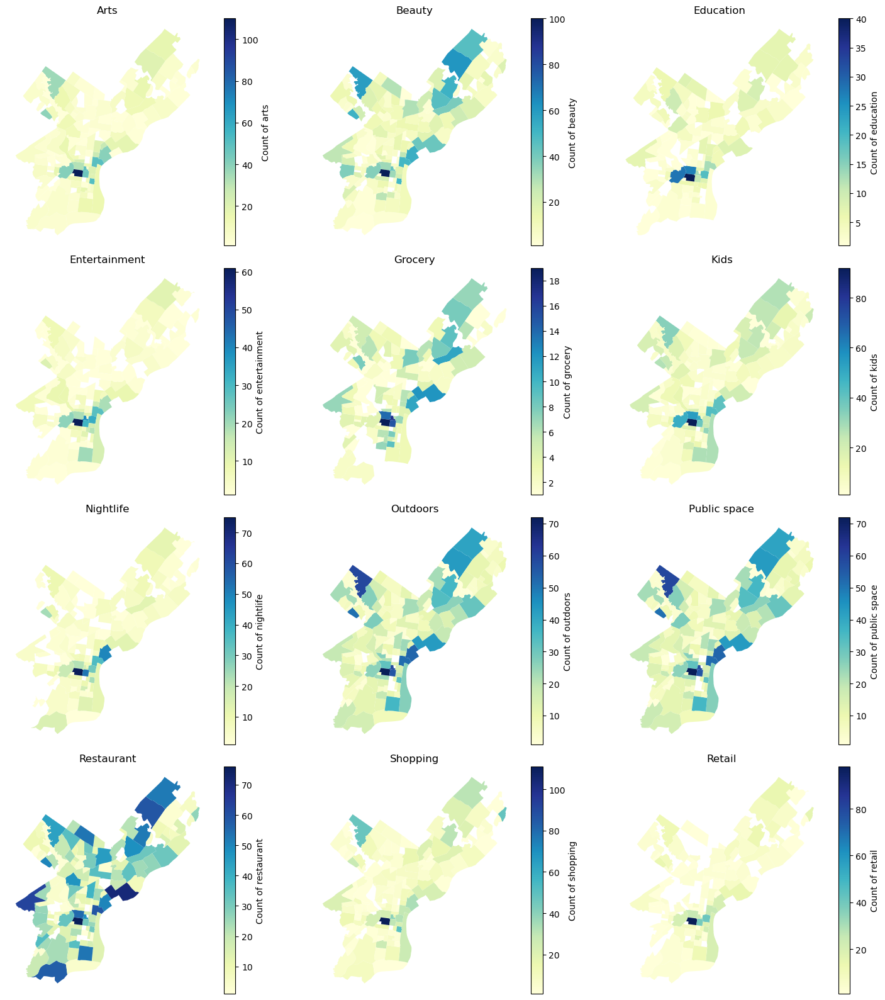

In [171]:
# Extract unique types
amenity_types = amenities_nb['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenities_nb[amenities_nb['type'] == amenity_type]

    # Plotting
    subset.plot(column='count', ax=axes[i], legend=True,
                legend_kwds={'label': "Count of " + amenity_type},
                cmap='YlGnBu')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()